In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from skimage.segmentation import mark_boundaries
%matplotlib inline
from fast_slic import Slic
plt.rcParams["figure.figsize"] = (80,20)

In [2]:
original = Image.open("original.png")
validate = Image.open("out1.png")
labels = Image.open("out2.png")
np_orig = np.asarray(original)
fg_bg_threshold = 100;
class_background = 0;
class_unknown = 1;
class_foreground = 2;

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.segmentation import random_walker
from skimage.data import binary_blobs
from skimage.exposure import rescale_intensity
import skimage


In [4]:
fg_bg_threshold = 100;
class_background = 0;
class_unknown = 1;
class_foreground = 2;

np_labels_foreground = np_labels > fg_bg_threshold 
# Background Labels
np_labels_background = np.logical_and(np_labels < fg_bg_threshold, np_labels > 0) 
# No Labels
np_no_labels = np_labels == 0

NameError: name 'np_labels' is not defined

In [5]:

original = original.resize((original.width // 4, original.height // 4), Image.ANTIALIAS)
labels = labels.resize((labels.width // 4, labels.height // 4), Image.NONE)
np_orig = np.asarray(original)
np_labels = np.asarray(labels)

In [12]:

validate = validate.resize((validate.width // 4, validate.height // 4), Image.ANTIALIAS)
np_valid = np.asarray(validate)

In [9]:

data = skimage.img_as_float(original)

In [25]:
labels = random_walker(np_orig, markers, beta=10, mode='bf')

In [33]:
labels.shape

(314, 631, 3)

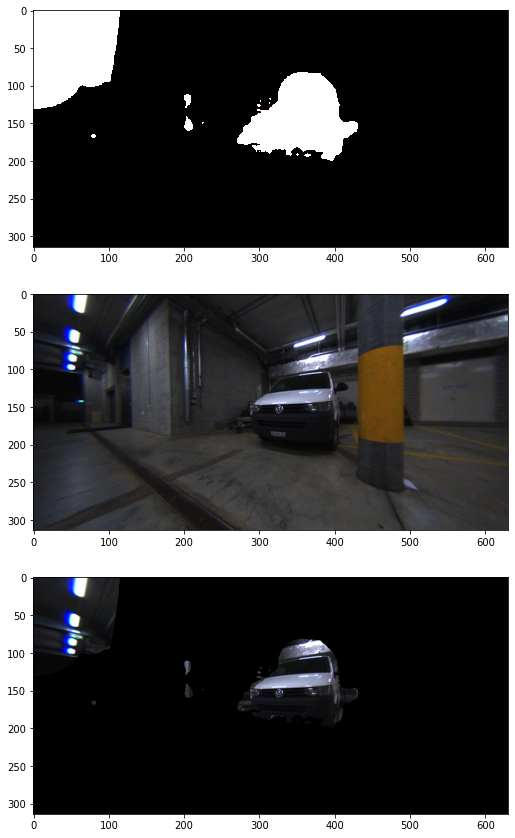

In [34]:
plt.subplot(4,1,1)
plt.imshow((labels-1)*255, cmap='nipy_spectral', interpolation='nearest')
plt.subplot(4,1,2)
plt.imshow(np_orig)
plt.subplot(4,1,3)
plt.imshow(np.multiply(np_orig, labels-1))

In [55]:

# The range of the binary image spans over (-1, 1).
# We choose the hottest and the coldest pixels as markers.
markers = np.zeros(np_labels_foreground.shape, dtype=np.uint)
markers[np_labels_foreground] = 1
markers[np_labels_background] = 2

In [57]:
markers.shape


(314, 631)

In [56]:

from skimage import feature
from skimage.color import rgb2gray



In [48]:
feature.canny(rgb2gray(np_orig), sigma=1)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [65]:
img = rgb2gray(np_orig)
blurred_f = ndimage.gaussian_filter(img, 3)

filter_blurred_f = ndimage.gaussian_filter(blurred_f, 1)

alpha = 30
sharpened = blurred_f + alpha * (blurred_f - filter_blurred_f)

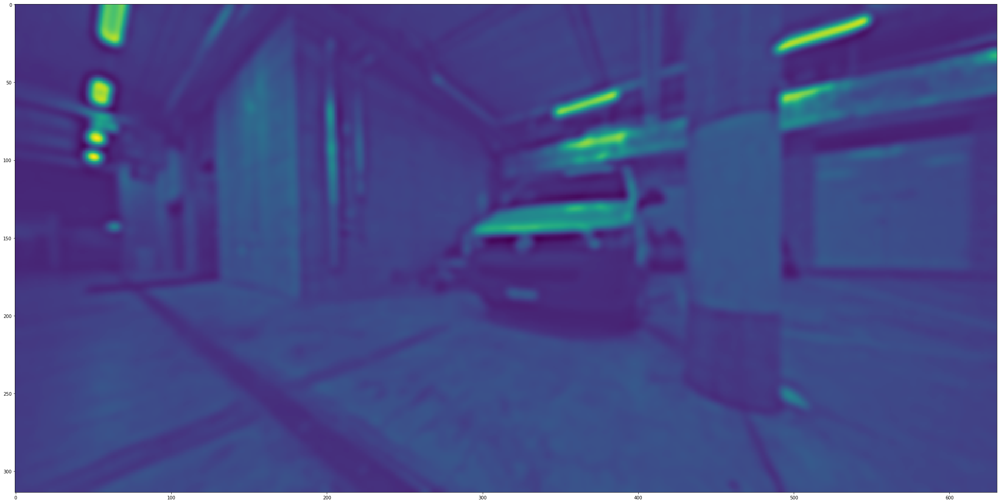

In [66]:
plt.imshow(sharpened)

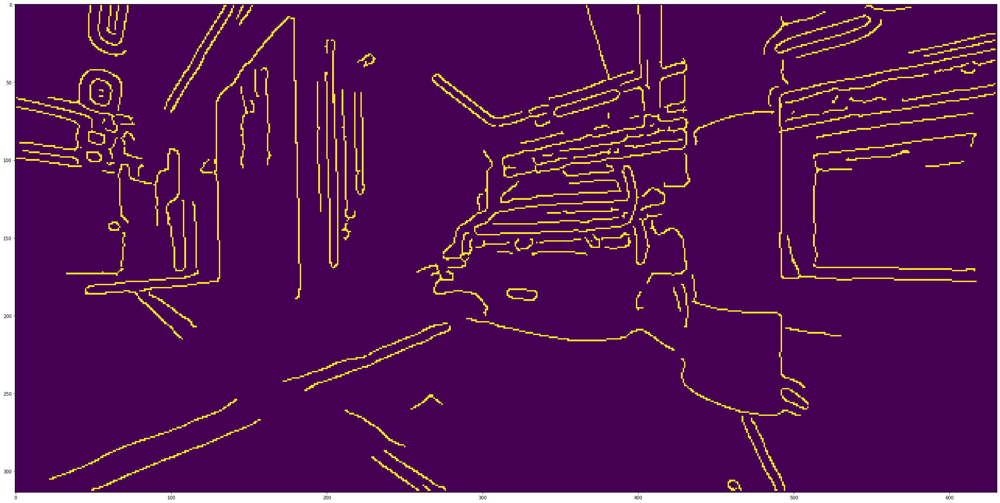

In [67]:
plt.imshow( feature.canny(sharpened,sigma=0))

In [85]:

from skimage.filters import roberts, sobel, scharr, prewitt

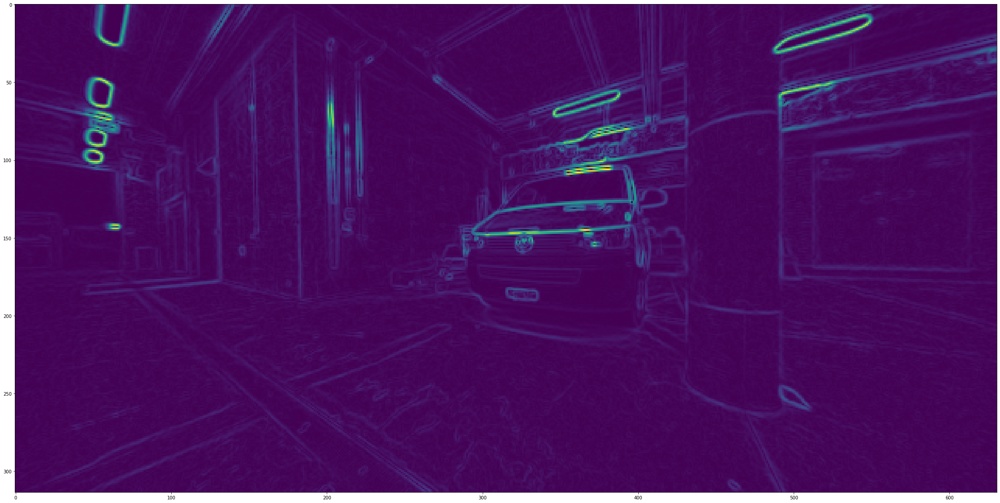

In [86]:
plt.imshow(sobel(rgb2gray(np_orig)))

In [73]:
from scipy import ndimage
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.feature import peak_local_max
labels_ws = watershed(feature.canny(rgb2gray(np_orig),sigma=0.1), markers)

In [59]:
np.unique(labels_ws)

array([1, 2], dtype=int32)

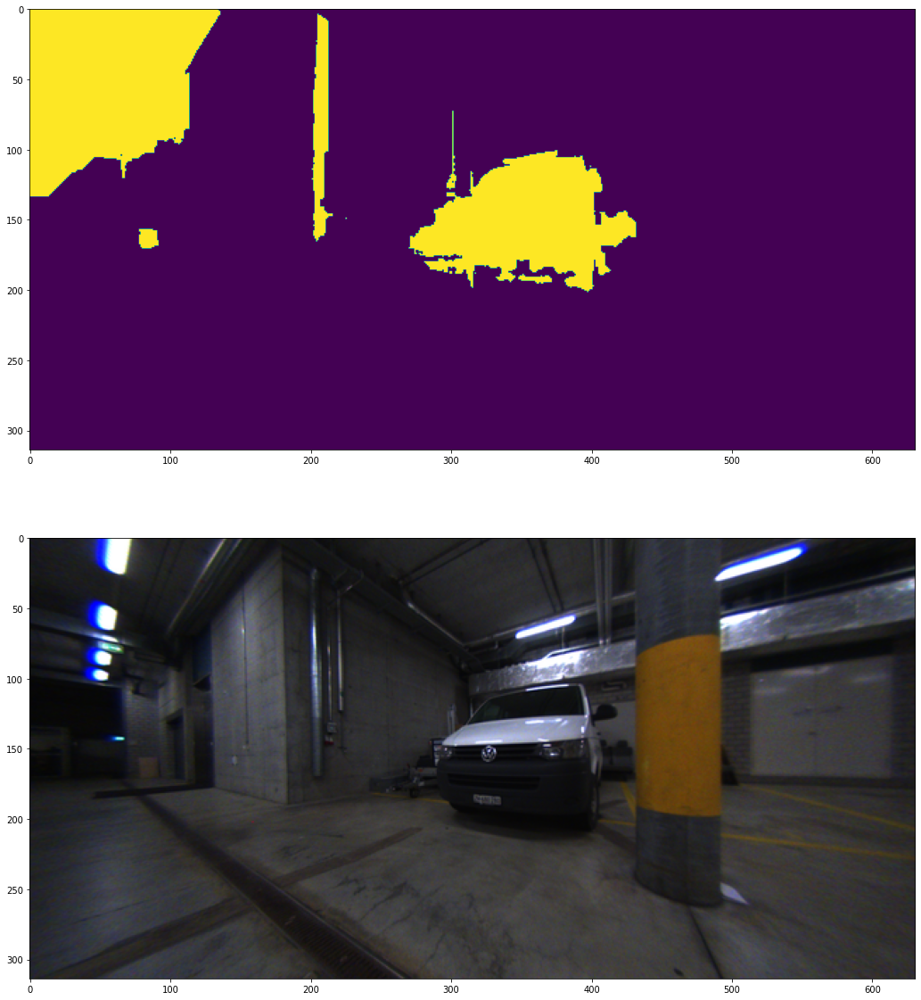

In [74]:
plt.subplot(2,1,1)
plt.imshow(labels_ws)
plt.subplot(2,1,2)
plt.imshow(np_orig)

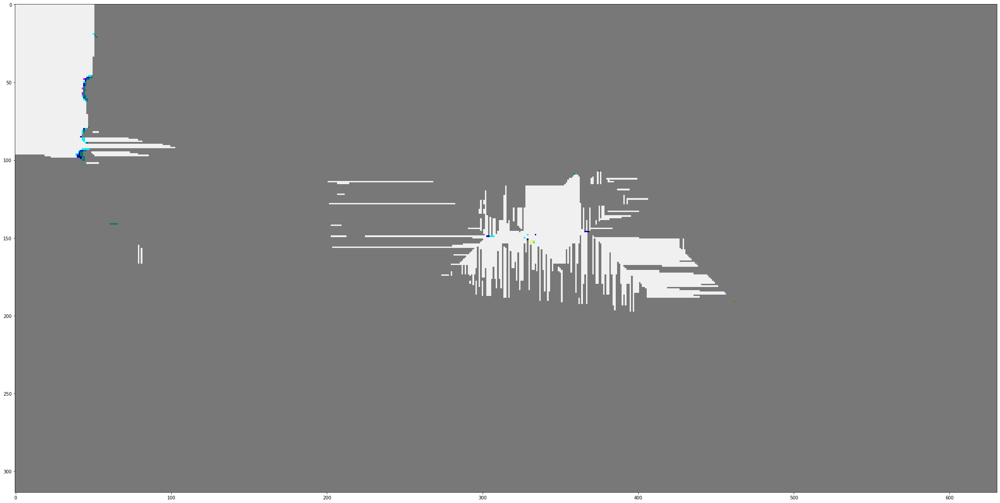

In [37]:
plt.imshow(labels_ws*120)

ValueError: Incompatible data and labels shapes.

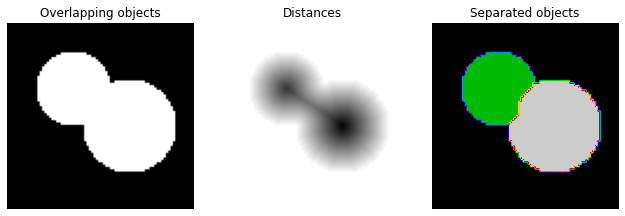

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage.segmentation import watershed
from skimage.feature import peak_local_max


# Generate an initial image with two overlapping circles
x, y = np.indices((80, 80))
x1, y1, x2, y2 = 28, 28, 44, 52
r1, r2 = 16, 20
mask_circle1 = (x - x1)**2 + (y - y1)**2 < r1**2
mask_circle2 = (x - x2)**2 + (y - y2)**2 < r2**2
image = np.logical_or(mask_circle1, mask_circle2)

# Now we want to separate the two objects in image
# Generate the markers as local maxima of the distance to the background
distance = ndi.distance_transform_edt(image)
local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                            labels=image)
markers = ndi.label(local_maxi)[0]
labels = watershed(-distance, markers, mask=image)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray)
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
ax[2].set_title('Separated objects')

for a in ax:
    a.set_axis_off()

fig.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.segmentation import random_walker
from skimage.data import binary_blobs
from skimage.exposure import rescale_intensity
import skimage

# Generate noisy synthetic data
data = skimage.img_as_float(original)
sigma = 0.35
data += np.random.normal(loc=0, scale=sigma, size=data.shape)
data = rescale_intensity(data, in_range=(-sigma, 1 + sigma),
                         out_range=(-1, 1))


# Run random walker algorithm
labels = random_walker(data, markers, beta=10, mode='bf')

# Plot results
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(8, 3.2),
                                    sharex=True, sharey=True)
ax1.imshow(data, cmap='gray')
ax1.axis('off')
ax1.set_title('Noisy data')
ax2.imshow(markers, cmap='magma')
ax2.axis('off')
ax2.set_title('Markers')
ax3.imshow(labels)
ax3.axis('off')
ax3.set_title('Segmentation')

fig.tight_layout()
plt.show()


Text(0.5, 1.0, 'background')

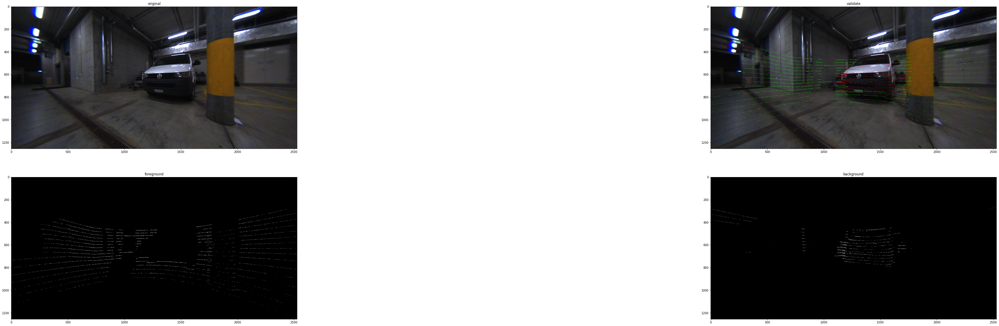

In [5]:
np_labels = np.asarray(labels)
# Foreground Labels
np_labels_foreground = np_labels > fg_bg_threshold 
# Background Labels
np_labels_background = np.logical_and(np_labels < fg_bg_threshold, np_labels > 0) 
# No Labels
np_no_labels = np_labels == 0

plt.subplot(2,2,1)
plt.imshow(original)
plt.title('original')
plt.subplot(2,2,2)
plt.imshow(validate)
plt.title('validate')
plt.subplot(2,2,3)
plt.imshow(Image.fromarray(np_labels_foreground))
plt.title('foreground')
plt.subplot(2,2,4)
plt.imshow(Image.fromarray(np_labels_background))
plt.title('background')

In [8]:

slic = Slic(num_components=1000, compactness=10)
superpixels = slic.iterate(np_orig)

In [14]:
validate = Image.open("out1.png")

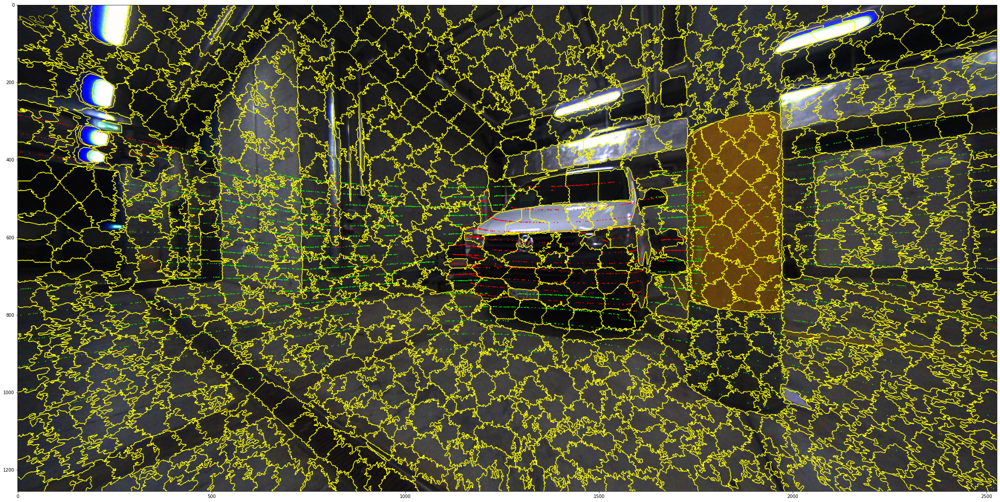

In [15]:
plt.imshow
    seeds_bg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_background > 0)).T]
    seeds_fg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_foreground > 0)).T](mark_boundaries(validate, superpixels))

In [16]:

seeds_bg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_background > 0)).T]
seeds_fg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_foreground > 0)).T]

/home/rene/tf_venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


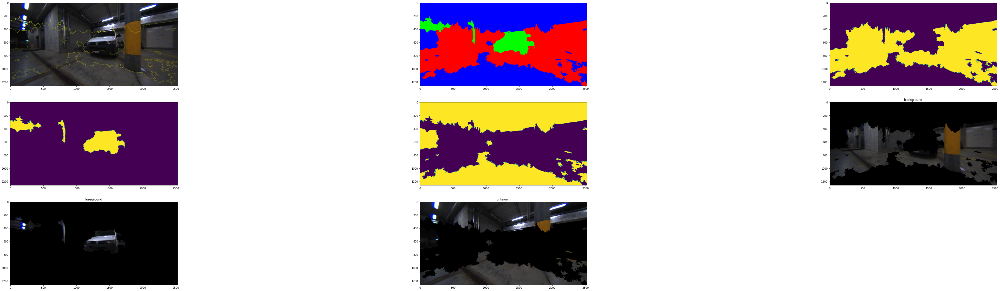

In [22]:
plot_reduced_sp(seeds_bg,seeds_fg,superpixels)

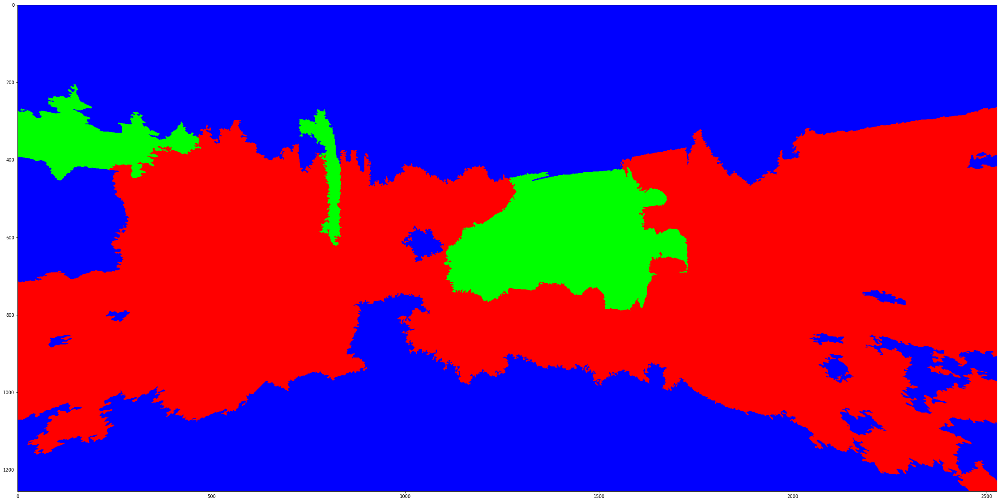

In [23]:
plt.imshow(to_rgb_mask(reduce_superpixel(seeds_bg, seeds_fg, superpixels)))

In [18]:
def reduce_superpixel(seeds_bg, seeds_fg, assignment):
    max_points = np.max(assignment) + 1
    # Stores how many time a cluster was assigned a given class
    accounting = np.zeros(max_points)
    
    for pointX,pointY in seeds_bg:
        superpixel_label = assignment[pointX,pointY];
        accounting[superpixel_label] = accounting[superpixel_label] + 1
    
    for pointX,pointY in seeds_fg:
        superpixel_label = assignment[pointX,pointY];
        accounting[superpixel_label] = accounting[superpixel_label] - 1
        
    for i in range(max_points):
        assignment[assignment == i] = (np.sign(accounting[i]) + 1)
        
    return assignment

In [19]:
def plot_reduced_sp(seeds_bg, seeds_fg, assignment):
    plt.subplot(3,3,1)
    plt.imshow(mark_boundaries(original, assignment))
    assign = reduce_superpixel(seeds_bg, seeds_fg, assignment)
    plt.subplot(3,3,2)
    plt.imshow(to_rgb_mask(assign))
    plt.subplot(3,3,3)
    plt.imshow(mark_boundaries(original, assign))
    
    plt_cnt = 0
    for i in (class_background, class_foreground, class_unknown):
        plt.subplot(3,3,3 + plt_cnt)
        plt.imshow(assign == i)
        plt_cnt = plt_cnt + 1
    plt.subplot(3,3,6)
    plt.imshow(np.multiply(original, np.stack([assign == class_background, assign == class_background, assign==class_background],axis = -1)))
    plt.title("background")
    plt.subplot(3,3,7)
    plt.imshow(np.multiply(original, np.stack([assign == class_foreground, assign == class_foreground, assign==class_foreground],axis = -1)))
    plt.title("foreground")
    plt.subplot(3,3,8)
    plt.imshow(np.multiply(original, np.stack([assign == class_unknown, assign == class_unknown, assign==class_unknown],axis = -1)))
    plt.title("unknown")

In [21]:
def to_rgb_mask(mask):
    mask_r = (mask == class_background) *255
    mask_g = (mask == class_foreground) *255
    mask_b = (mask == class_unknown) *255
    return Image.fromarray(np.uint8(np.stack([mask_r, mask_g, mask_b], axis = -1)))

In [79]:
def get_preview_image(original, binary_mask):
    img = to_rgb_mask(binary_mask)
    img.putalpha(50)
    new_img = original.copy()
    new_img.paste(img, (0, 0), img)
    return new_img;

In [112]:
fg_bg_threshold = 100;
class_background = 0;
class_unknown = 1;
class_foreground = 2;
slic = Slic(num_components=1000, compactness=10)


def convert_file_path_to_gt(f):
    original = Image.open(f.replace("labels", "original"))
    labels = Image.open(f)
    original = original.resize((original.width // 2, original.height // 2), Image.ANTIALIAS)
    labels = labels.resize((labels.width // 2, labels.height // 2), Image.NONE)
    np_orig = np.asarray(original)
    np_labels = np.asarray(labels)
    # Foreground Labels
    np_labels_foreground = np_labels > fg_bg_threshold 
    # Background Labels
    np_labels_background = np.logical_and(np_labels < fg_bg_threshold, np_labels > 0) 
    # No Labels
    np_no_labels = np_labels == 0
    
    seeds_bg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_background > 0)).T]
    seeds_fg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_foreground > 0)).T]
    
    #superpixels = slic.iterate(feature.canny(rgb2gray(np_orig),sigma=0.1))
    #superpixels = skimage.segmentation.slic(np_orig, n_segments=1000, compactness=0.1, sigma=1,
    #                 start_label=1)
    
    #mask = reduce_superpixel(seeds_bg,seeds_fg, superpixels)
    markers = np.zeros(np_labels_foreground.shape, dtype=np.uint)
    markers[np_labels_foreground] = 1
    markers[np_labels_background] = 2
    
    mask = watershed(feature.canny(rgb2gray(np_orig),sigma=0.1), markers)
  
    
    Image.fromarray(mask).save(f.replace('imgs','imgs_preproc_ws').replace('labels','mask'))
    get_preview_image(original, mask).save(f.replace('imgs','imgs_preproc_ws').replace('labels','spx_preview'))

In [316]:
assign = reduce_superpixel(seeds_bg, seeds_fg, slic.iterate(np_orig))

In [75]:
plt.imshow(get_preview_image(original, assign))

NameError: name 'get_preview_image' is not defined

In [317]:
img = to_rgb_mask(assign)
img.putalpha(50)
new_img = original.copy()

In [304]:
new_img.paste(img, (0, 0), img)

In [314]:
seeds_bg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_background > 0)).T]
seeds_fg = [(c[0],c[1]) for c in np.asarray(np.where(np_labels_foreground > 0)).T]

In [83]:
from os import listdir
import os
from os.path import isfile, join
files_labels = ['imgs/'+f for f in listdir('imgs') if isfile(join('imgs', f)) if "label" in f]
files_preview = ['imgs/'+f for f in listdir('imgs') if isfile(join('imgs', f)) if "preview" in f]
files_original = ['imgs/'+f for f in listdir('imgs') if isfile(join('imgs', f)) if "original" in f]

In [113]:

cnt = 1;
for file in files_labels:
    print("[", cnt , "/",len(files_labels),"]  -   " ,file, end="\r")
    cnt += 1
    convert_file_path_to_gt(file)

/home/rene/tf_venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


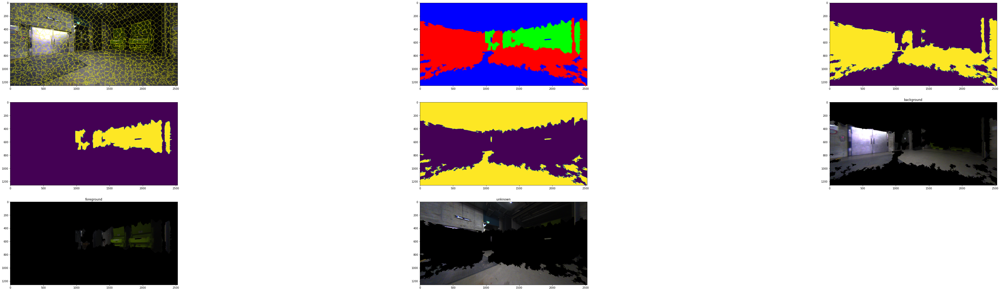

In [315]:
# import cv2; image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)   # You can convert the image to CIELAB space if you need.
slic = Slic(num_components=1000, compactness=10)
plot_reduced_sp(seeds_bg, seeds_fg, slic.iterate(np_orig))

In [213]:
import skimage as skimage

img = img_as_float(np_orig)

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = skimage.segmentation.slic(img, n_segments=1000, compactness=10, sigma=1,
                     start_label=1)
segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img))
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

/home/rene/tf_venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


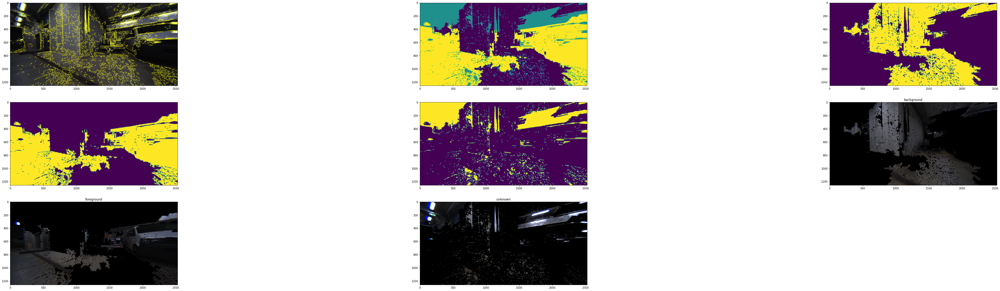

In [201]:
plot_reduced_sp(seeds_bg, seeds_fg, segments_fz)

/home/rene/tf_venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


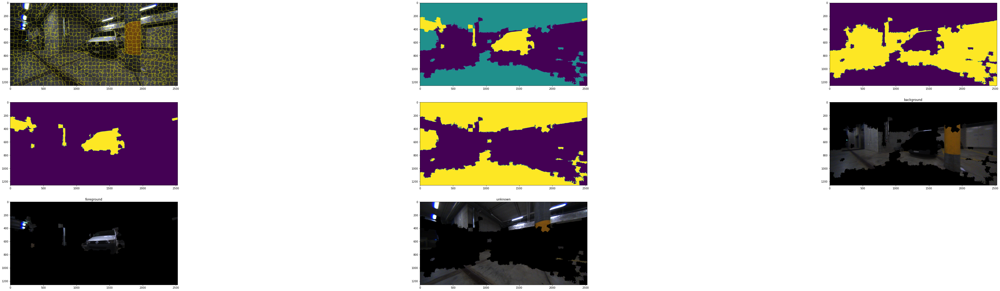

In [214]:
plot_reduced_sp(seeds_bg, seeds_fg, segments_slic)

/home/rene/tf_venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


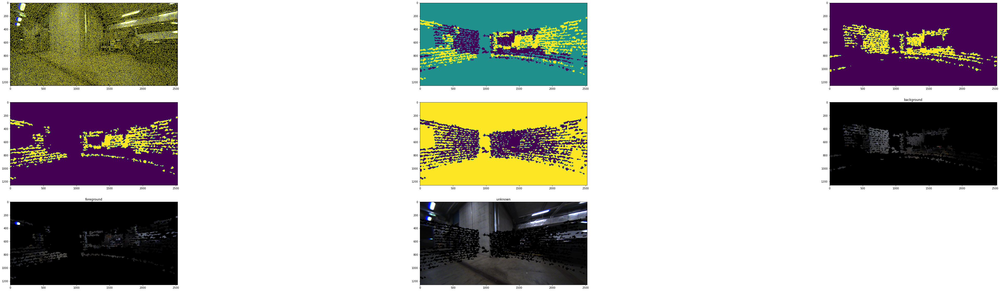

In [203]:
plot_reduced_sp(seeds_bg, seeds_fg, segments_quick)